# Inicialização

In [1]:
from collections import Counter
from itertools import product
import re
import time
import unicodedata

import yaml
import numpy as np
import pandas as pd
from sklearn.decomposition.nmf import ProjectedGradientNMF
from sklearn.preprocessing import normalize

import matplotlib.pyplot as plt
%matplotlib inline

import nltk
from nltk.tokenize import TweetTokenizer

In [2]:
from bokeh.models import ColumnDataSource
import bokeh.plotting


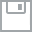
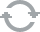
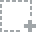
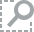
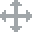
...
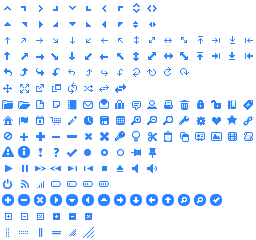
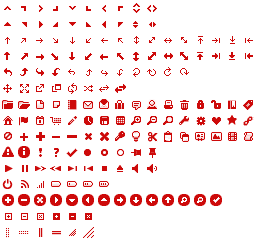
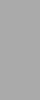
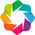
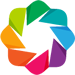

In [3]:
bokeh.plotting.output_notebook()

In [4]:
import elasticsearch
from elasticsearch.helpers import scan, bulk

In [65]:
# Usar tunel
# $ ssh ubuntu@twitter-es.twist.systems -L10200:localhost:9200
es_conn = elasticsearch.Elasticsearch("localhost:10200", timeout=300)
es_conn.ping()

True

# Tokenização

In [14]:
def doc_to_tweet(docs):
    for doc in docs:
        text = doc['_source'].get('text', '')
        if text:
            yield text

In [15]:
TOKENIZER = TweetTokenizer()
RE_JAJA = re.compile('^[jae]{2,}$')

def filter_tokens(tokens):
    
    for token in tokens:
        if RE_JAJA.match(token.lower()):
            yield "jaja"
        else:
            yield token

def tokenize_tweets(tweets):
    tokenizer = TOKENIZER
    for tweet in tweets:
        # Perform normalization of unicode characters
        #tweet = unicodedata.normalize("NFC", tweet)
        tweet = ''.join(unicodedata.normalize('NFD', x)[0] for x in tweet)

        tokens = tokenizer.tokenize(tweet)
  
        yield list(filter_tokens(tokens))

In [13]:
query = yaml.safe_load("""
query:
    filtered:
        filter:
            bool:
                must:
                - term:
                    user: tuenti
_source:
    include:
    - user_info.screen_name
    - created_at
    - text
    - id
""")

docs = scan(es_conn, index="twitter", doc_type="tweet", query=query, size=1000)
docs_df = pd.DataFrame.from_dict(
    (
        {
            "twitter_id": doc["_source"]["id"],
            "screen_name": doc["_source"]["user_info"]["screen_name"],
            "created_at": pd.to_datetime(doc["_source"]["created_at"]),
            "text": doc["_source"].get("text","")
        } for doc in docs),
    orient="columns"
)

In [18]:
# Tokenize
docs_df['tokenized'] = pd.Series(tokenize_tweets(docs_df['text'].values), index=docs_df.index)

In [70]:
docs_df.to_pickle('tweets_tuenti_tokenized_all.p')

In [20]:
docs_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16900 entries, 0 to 16899
Data columns (total 5 columns):
created_at     16900 non-null datetime64[ns]
screen_name    16900 non-null object
text           16900 non-null object
twitter_id     16900 non-null object
tokenized      16900 non-null object
dtypes: datetime64[ns](1), object(4)
memory usage: 792.2+ KB


# Montagem da matriz de documentos

In [9]:
wordlist = pd.read_pickle('wordlist.p')

In [21]:
wordlist_indices = dict(tuple(reversed(x)) for x in enumerate(wordlist))

In [22]:
doc_mat = np.zeros((docs_df.shape[0], len(wordlist)))

In [23]:
for idx_row, tokens in enumerate(docs_df['tokenized'].values):
    for token in tokens:
        token = token.lower()
        if token not in wordlist_indices:
            continue
            
        idx_token = wordlist_indices[token]
        doc_mat[idx_row, idx_token] = 1.0

In [24]:
doc_mat_norm = normalize(doc_mat)

In [25]:
S = np.dot(doc_mat_norm.T, doc_mat_norm)

In [26]:
S.shape

(833, 833)

In [27]:
D = np.power(np.sum(S, axis=1), -0.5) * np.eye(S.shape[0])

In [28]:
Y = np.dot(D, doc_mat.T)

In [29]:
Y.shape

(833, 16900)

# Cálculo da NMF

In [31]:
def edges_sum(cond_1, cond_2, S):
    nodes_1 = np.where(cond_1)[0]
    nodes_2 = np.where(cond_2)[0]
    
    indices = product(nodes_1, nodes_2)
    return np.sum(S[idx] for idx in indices)


def n_cut(mat_U, mat_S):
    
    term_clusters = mat_U.argmax(axis=1)
    
    n_k = mat_U.shape[1]
    
    result = 0.0
    for idx_k in range(n_k):
        
        cond_g_k = term_clusters == idx_k
        num = edges_sum(cond_g_k, ~cond_g_k, mat_S)
        den = edges_sum(cond_g_k,  cond_g_k, mat_S) + num
        
        result += num/den
        
    return 0.5 * result
    

In [32]:
models = {}

source = ColumnDataSource(data={"x": [0], "y": [0]})

plot = bokeh.plotting.figure(title="Ncut", plot_height=500, plot_width=900)
plot.line(source.data['x'], source.data['y'], color="#2222aa", line_width=2, source=source)
plot.circle(source.data['x'], source.data['y'], color="#2222aa", fill_color="white", size=8, source=source)
bokeh.plotting.show(plot)

In [25]:
import random

In [36]:
num_topics = list(range(5, 100))
random.shuffle(num_topics)
random.shuffle(num_topics)
random.shuffle(num_topics)

In [33]:
#for k in num_topics:
for k in [40]:
    
    start_time = time.time()
    print(k)
    model = ProjectedGradientNMF(n_components=k, init="nndsvda", max_iter=1000)
    V_T = model.fit_transform(Y.T)
    U_T = model.components_
    n_cut_val = n_cut(U_T.T, S)
    
    models[k] = {
        "model": model,
        "V_T": V_T,
        "n_cut": n_cut_val,
    }
    end_time = time.time()
    
    #print("%d: %f" %(k, end_time - start_time))
    
    source.data['x'] = sorted(models.keys())
    source.data['y'] = [models[x]["n_cut"]/x for x in source.data['x']]
    source.push_notebook()

40


In [35]:
pd.to_pickle(models, 'tuenti_models_40.p')

In [68]:
def get_terms(data, wordlist):
    components = data['model'].components_
    words = np.argsort(-1*components, axis=1)[:,:10]
    np_wordlist = np.array(wordlist)
    
    return np_wordlist[words].tolist()

def print_terms(data, wordlist):
    terms = get_terms(data, wordlist)
    
    for idx_topic, terms_topic in enumerate(terms):
        print("%3d: %s" % (idx_topic, " ".join(terms_topic)))
        
def get_tweets(data, cluster, tweets):
    print(data['V_T'].shape)
    clusters = np.argmax(data['V_T'], axis=1)
    cluster_tweets = tweets[clusters == cluster]
    return cluster_tweets

In [37]:
print_terms(models[40], wordlist)

  0: trios agosto junio julio sabado domingo viernes cama mejores whatsapp
  1: olvida line vete nombre pega cara tumblr casa whatsapp instagram
  2: llevarte venis registrate #dearriba veni combo podes semana parte @tuentiar
  3: lof muxo no-mencionarme srsly gracias foto jaja visto alguna gilipollas
  4: creado tecnologica ninguna cantera espana tanta empresa start-ups superiores plantas
  5: centramos creemos foco alli primeros pasar entrevis anos entrevista @xatakamovil
  6: cartas eliminan rompian bloquean facebook fotos twitter ok subir ai
  7: juro mias ponia doy comentarios veo verguenza fotos ajena puso
  8: pruebalo compra nube coste llevamos @tuenties movil descarga app prueba
  9: proximity trabajar madrid empieza fundada #marketing comienza tecnologia marketing ma
 10: adeyemi ajao valley cofundador silicon entrevista puedes deberiamos trabajo fundador
 11: redes chica caido sigue sociales funciona ahi nunca facebook twitter
 12: empezo mira mismo acabo partido acordar put

In [38]:
Counter(np.argmax(models[40]['V_T'], axis=1))

Counter({0: 1269,
         1: 420,
         2: 88,
         3: 686,
         4: 165,
         5: 127,
         6: 313,
         7: 232,
         8: 73,
         9: 135,
         10: 53,
         11: 681,
         12: 597,
         13: 250,
         14: 230,
         15: 113,
         16: 83,
         17: 233,
         18: 107,
         19: 614,
         20: 92,
         21: 44,
         22: 256,
         23: 668,
         24: 193,
         25: 76,
         26: 297,
         27: 767,
         28: 171,
         29: 444,
         30: 231,
         31: 143,
         32: 538,
         33: 1341,
         34: 418,
         35: 335,
         36: 158,
         37: 161,
         38: 267,
         39: 3831})

In [69]:
print('\n---\n'.join(x for x in get_tweets(models[40], 13, docs_df)['text'].drop_duplicates(inplace=False)))

(16900, 40)
Pfff, ¿os acordáis de cuando todo kiski era un choni emo en tuenti? Tenía 13 años y no lo entendía, tengo 15 y ahora menos JAJA.
---
RT @besidemcvey: rt si tuviste esa época mala tuenti de ser choni sin saberlo pq todo el mundo era choni
fav si por suerte no tuviste tuent8
---
Esto q es por dio, ahora to el mundo metio en tuenti o q? JAJAJAJAJAJAJAJA
---
RT @longwayjade: Que mala época fue tuenti dios mio como me alegro de ponerme mi nombre normal en el
---
@SanchezMonica96 sí y te escribo como en la epoca tuenti tambien😋😋😋
---
Fav si Pablo agregame a tuenti
---
RT @TodoFamosos3: Tener hoy mi tuenti lleno de fotos de #Felices27BlancaSuarez Blanca es lo mejor del mundo!
---
Volvemos a la época de tuenti #15años
---
@mansilla_9 el fav x la carita tuenti jajajaaaja tlove 💞
---
@Heeeeeercules Todo el mundo quiere ser amigo del gran Hercules  ;) (yo huyo de tuenti, entre face y twitter voy servida)
---
@_Reminiscencia_ Pues sí, pero por suerte no sé casi nada sobre tuenti y me a

In [46]:
words = np.argsort(-1*components, axis=1)[:,:30]

NameError: name 'components' is not defined

In [141]:
np_wordlist = np.array(wordlist)

In [143]:
np_wordlist[words].tolist()

[['olvida',
  'line',
  'vete',
  'casa',
  'tumblr',
  'nombre',
  'cara',
  'pega',
  'whatsapp',
  'instagram',
  'twitter',
  'insta',
  'vuelta',
  'facebook',
  'snapchat',
  'skype',
  'google',
  'vida',
  'teniamos',
  'messenger',
  'msn',
  'falta',
  'hora',
  'luego',
  'youtube',
  '😌',
  'chica',
  'hace',
  'redes',
  'caido'],
 ['centramos',
  'creemos',
  'foco',
  'alli',
  'primeros',
  'pasar',
  'entrevis',
  'entrevista',
  'anos',
  '@xatakamovil',
  'ajao',
  'adeyemi',
  'valley',
  'cofundador',
  'silicon',
  'puedes',
  'deberiamos',
  '@sebasmuriel',
  'historia',
  'paso',
  'primer',
  '#moviles',
  'hacerme',
  'acaba',
  'via',
  'hace',
  'telefonica',
  'fundador',
  'cuenta',
  'trabajo'],
 ['trios',
  'sabado',
  'agosto',
  'junio',
  'julio',
  'viernes',
  'domingo',
  'cama',
  'mejores',
  'whatsapp',
  'twitter',
  '😉',
  '😏',
  'palabra',
  'ponen',
  'tablon',
  'amigo',
  'equipo',
  '👉',
  'dios',
  '@sebasmuriel',
  'manana',
  'megas',


In [45]:
def coherence_norm(data, tf_idf_norm):
    clusters = np.argmax(data['V_T'], axis=1)
    n_clusters = data['V_T'].shape[1]
    
    clusters_norm = []
    clusters_size = []
    coherence_cluster = []
    
    for idx_cluster in range(n_clusters):
        
        cluster_data = tf_idf_norm[clusters == idx_cluster]
        avg_vector = np.average(cluster_data, axis=0)
        cluster_norm = np.sqrt(np.power(avg_vector, 2).sum())
        clusters_norm.append(cluster_norm)
        clusters_size.append(cluster_data.shape[0])
        
        if cluster_data.shape[0] > 3:
            coherence_cluster.append(cluster_norm)
    
    
    data['avg_clusters_norm'] = clusters_norm
    data['clusters_size'] = clusters_size
    data['coherence_norm'] = np.average(clusters_norm)
    return np.average(coherence_cluster), np.std(clusters_norm)

In [47]:
for key in sorted(models.keys()):
    coherence_norm(models[key], doc_mat_norm)

In [50]:
data_x = sorted(models.keys())
data_ncut = [models[x]["n_cut"]/x for x in data_x]
data_coh = [models[x]["coherence_norm"] for x in data_x]

hover = bokeh.models.HoverTool(
        tooltips=[
            ("index", "$index"),
            ("(x, y)", "($x, $y)"),        ]
    )


plot = bokeh.plotting.figure(
    title="Ncut vs Coherence",
    plot_height=500, plot_width=900,
    tools=[hover, bokeh.models.ResizeTool(), bokeh.models.PanTool(), bokeh.models.WheelZoomTool()])

plot.line(data_x, data_ncut, color="#2222aa", line_width=2)
#plot.circle(data_x, data_ncut, color="#2222aa", fill_color="white", size=8)

plot.extra_y_ranges = {"coherence": bokeh.models.Range1d(start=0.0, end=1.0)}
plot.line(data_x, data_coh, line_width=2, color="red", y_range_name="coherence")
plot.add_layout(bokeh.models.LinearAxis(y_range_name="coherence"), 'right')

bokeh.plotting.show(plot)

In [53]:
data_x = sorted(models.keys())
data_ncut = [models[x]["n_cut"]/x for x in data_x]
data_coh = [models[x]["coherence_norm"] for x in data_x]

hover = bokeh.models.HoverTool(
        tooltips=[
            ("index", "$index"),
            ("(x, y)", "($x, $y)"),        ]
    )


plot = bokeh.plotting.figure(
    title="Ncut vs Coherence",
    plot_height=500, plot_width=900,
    tools=[hover, bokeh.models.ResizeTool(), bokeh.models.PanTool(), bokeh.models.WheelZoomTool()])


plot.circle(data_coh, data_ncut, color="#2222aa", size=4)
plot.xaxis.axis_label = "Coherence"
plot.yaxis.axis_label = "Ncut"

bokeh.plotting.show(plot)

In [41]:
from IPython.display import display

In [45]:
def plot_topic_wordclouds(data, wordlist):
    
    components = data['model'].components_
    sorted_components = np.sort(-1*components)*-1
    word_idxs = np.argsort(-1*components, axis=1)[:,:50]
    words = np.array(wordlist)[word_idxs]
    weights = sorted_components[:,:50]
    
    # Find minimum weight that is still greater than 0.01
    all_weights = weights.reshape((-1,))
    all_weights.sort()
    min_weight = all_weights[all_weights >= 0.01][0]
    weights = weights / min_weight
    weights = weights.round().astype('int')
    
    for idx_topic in range(components.shape[0]):
    #for idx_topic in [1, 4, 5, 6, 9, 16, 17, 19, 20, 25, 26, 28, 32, 39]:
        
        topic_terms = words[idx_topic, :].tolist()
        topic_weights = weights[idx_topic, :].tolist()
        topic_words = list(zip(topic_terms, topic_weights))
        topic_words.sort(key=lambda x:x[1], reverse=True)
        print(idx_topic)
        
        fig, ax = plt.subplots(figsize=(12,6))
        plot_wordcloud(topic_words, ax=ax)
        display(fig)

In [63]:
from wordcloud import WordCloud

def plot_wordcloud(words, ax=None, **kwargs):
    
    default_kwargs = {
        "font_path": "impact.ttf",
        "background_color": "white",
        "max_font_size": 70,
        "prefer_horizontal": 1.0,
        "width": 700,
        "height": 300,
    }
    
    default_kwargs.update(kwargs)
    wordcloud = WordCloud(**default_kwargs)
    generated_wordcloud = wordcloud.generate_from_frequencies(words)
    
    if ax is None:
        fig, ax = plt.subplots(figsize=(14, 7))
    
    ax.set_aspect('equal')
    ax.imshow(generated_wordcloud)
    ax.axis("off")
    return generated_wordcloud

0


/home/felipefg/.virtualenvs/analysis_py34/lib/python3.4/site-packages/PIL/ImageDraw.py:104: UserWarning: setfont() is deprecated. Please set the attribute directly instead.
  "Please set the attribute directly instead.")


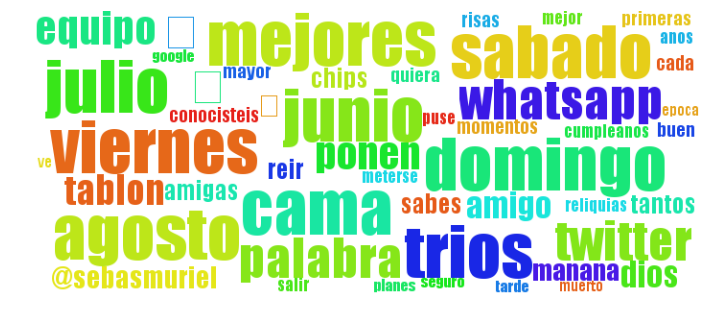

1


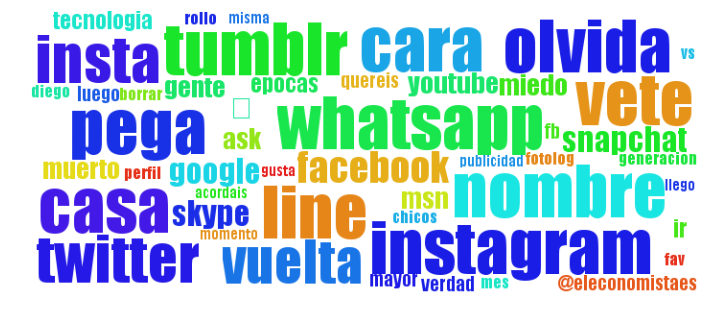

2


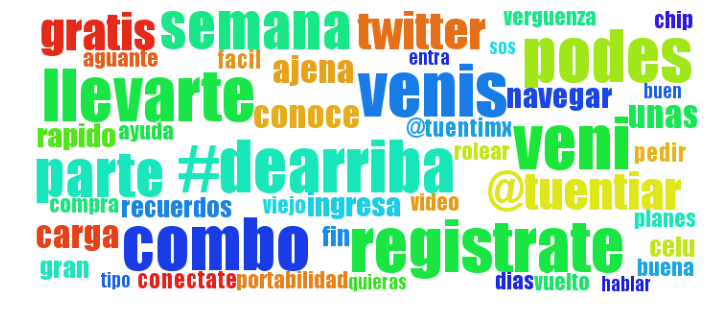

3


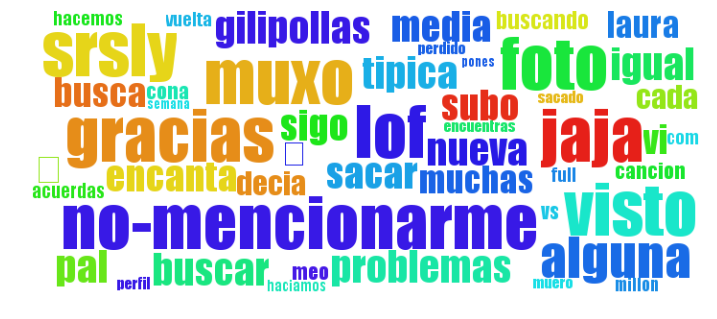

4


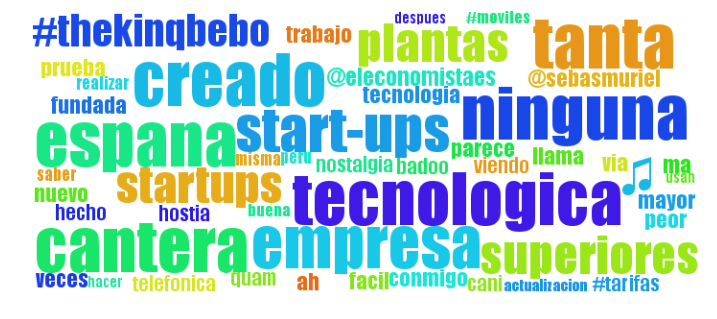

5


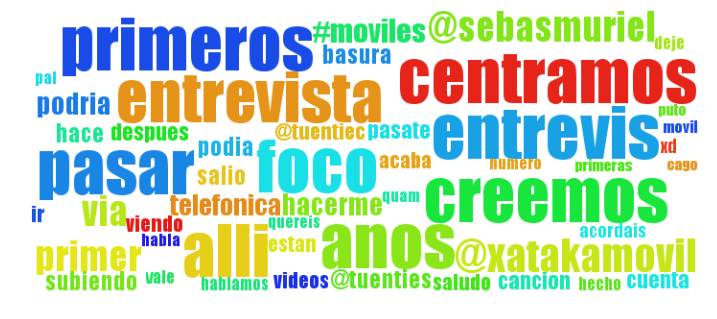

6


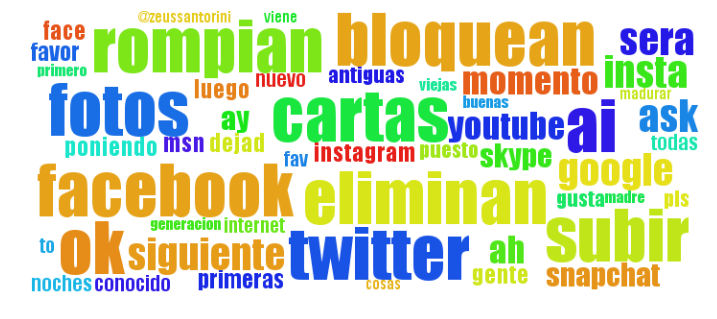

7


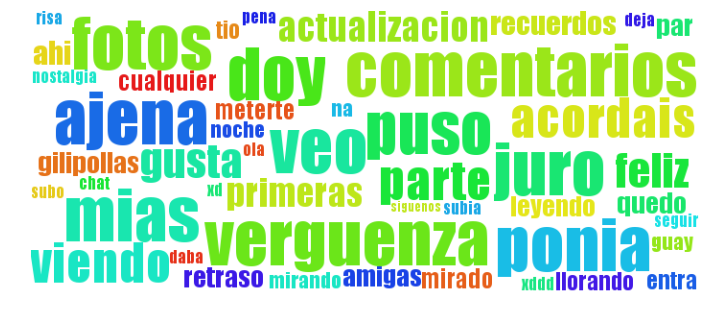

8


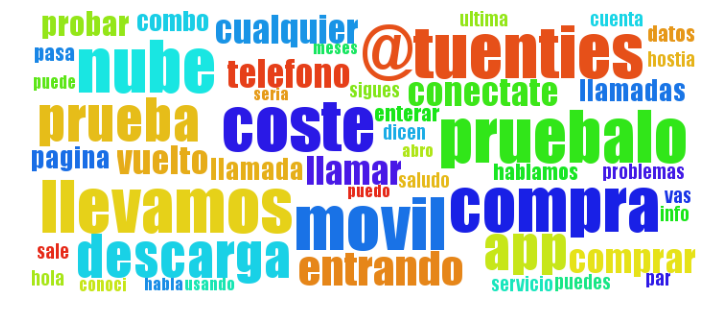

9


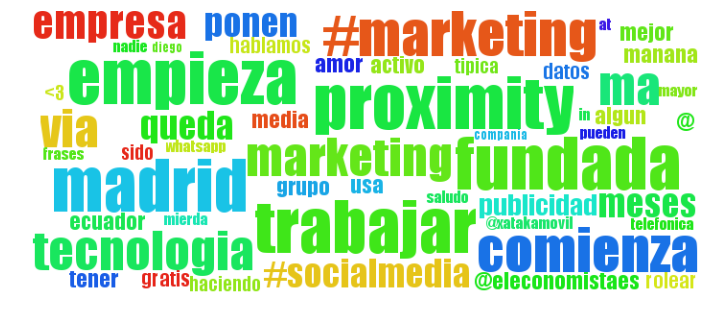

10


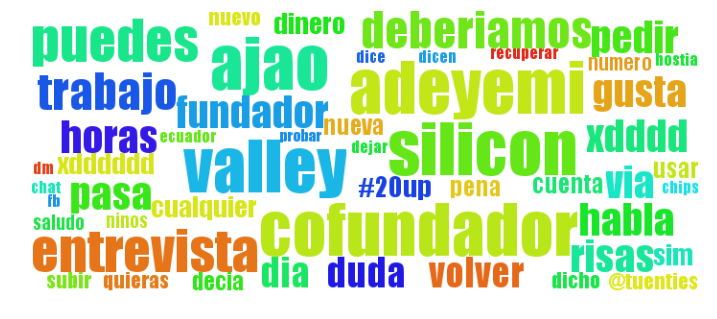

11


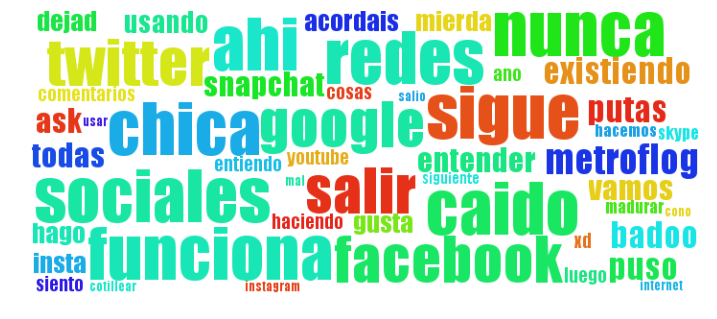

12


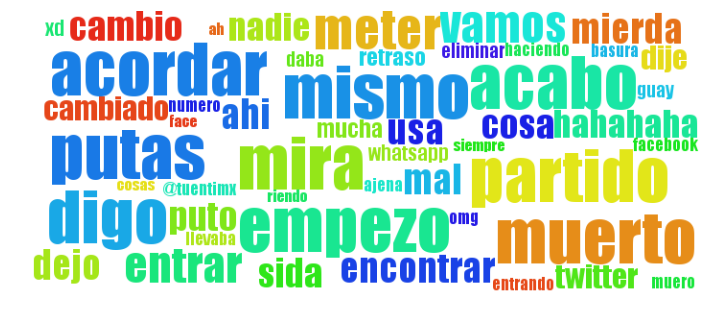

13


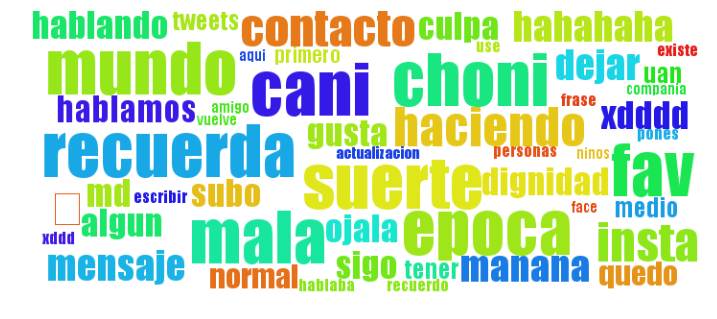

14


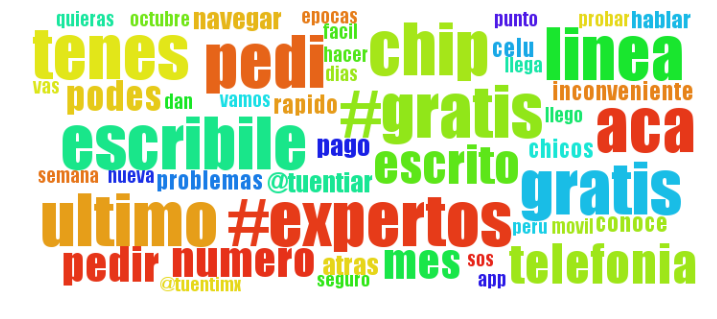

15


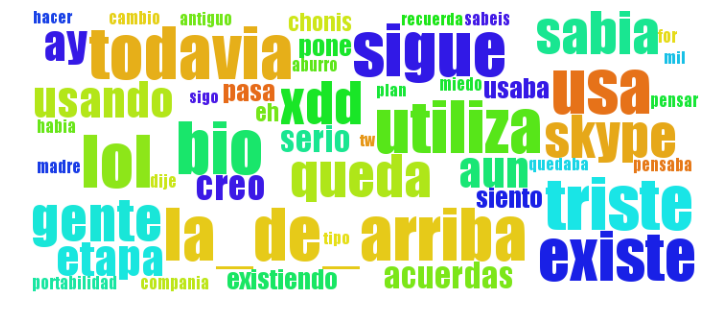

16


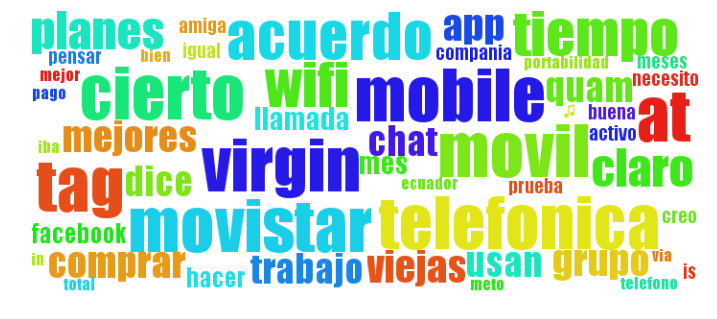

17


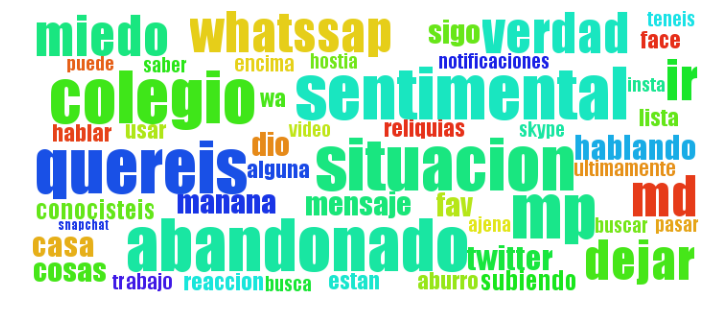

18


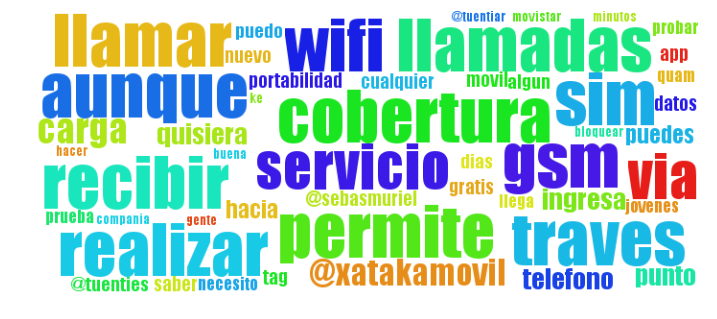

19


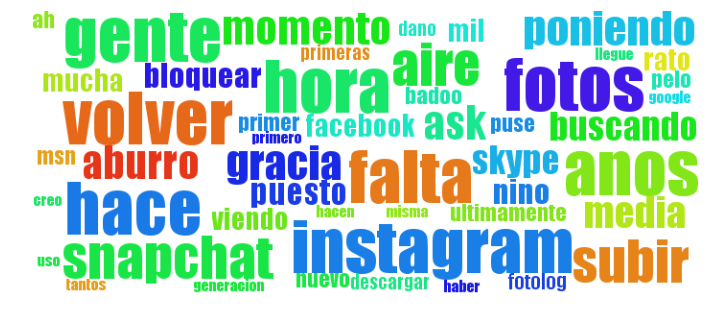

20


/home/felipefg/.virtualenvs/analysis_py34/lib/python3.4/site-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


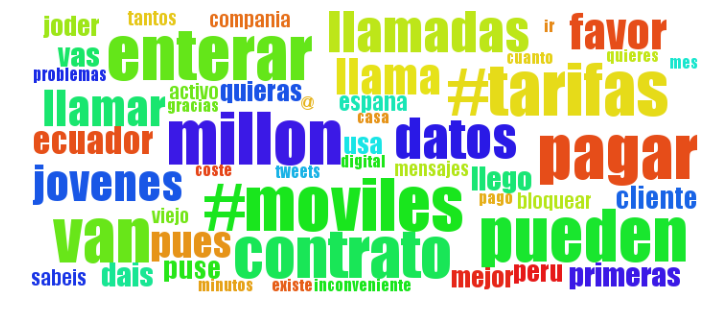

21


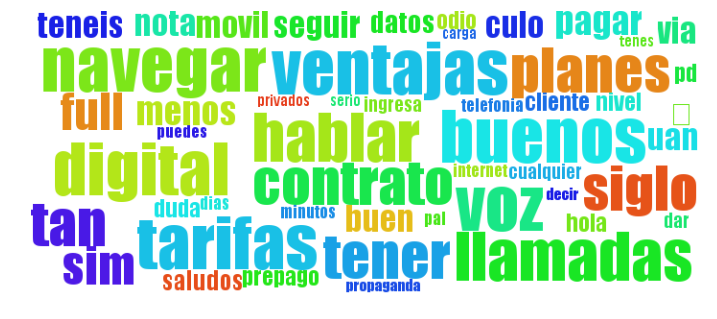

22


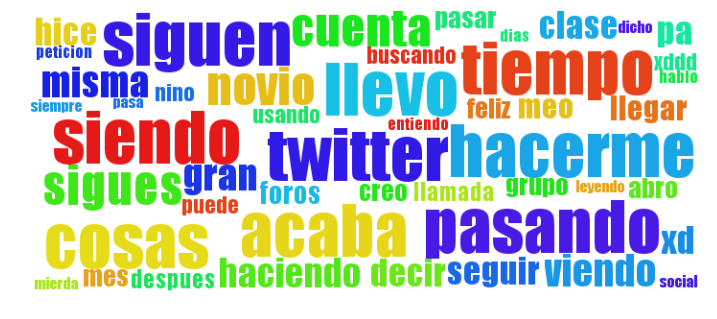

23


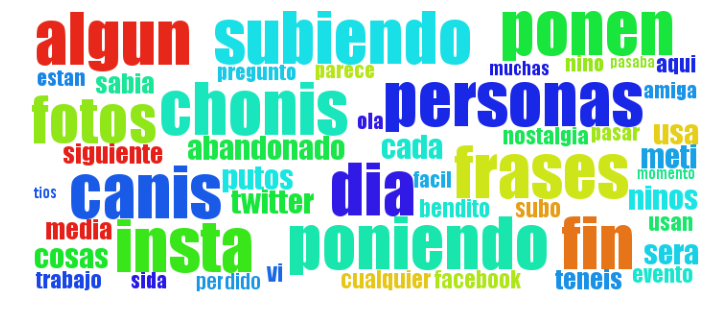

24


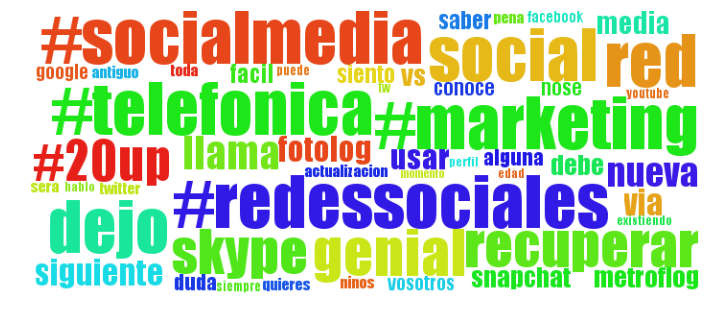

25


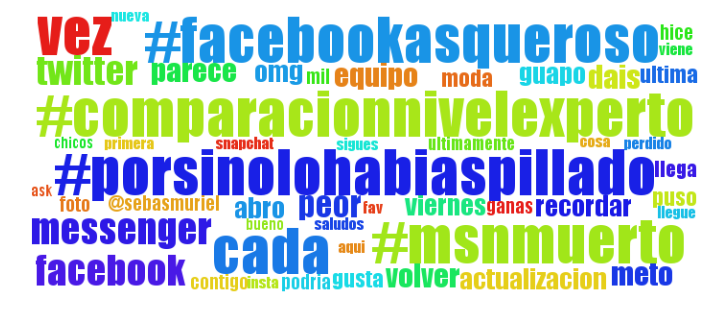

26


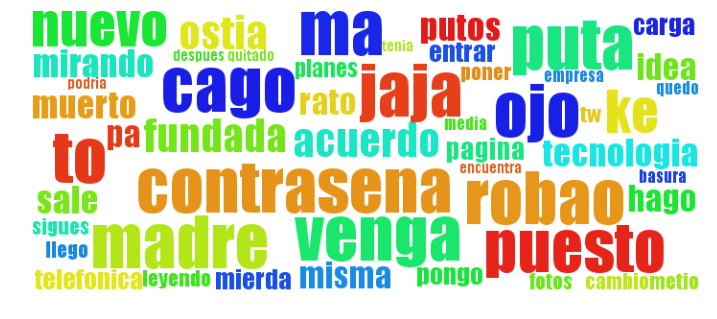

27


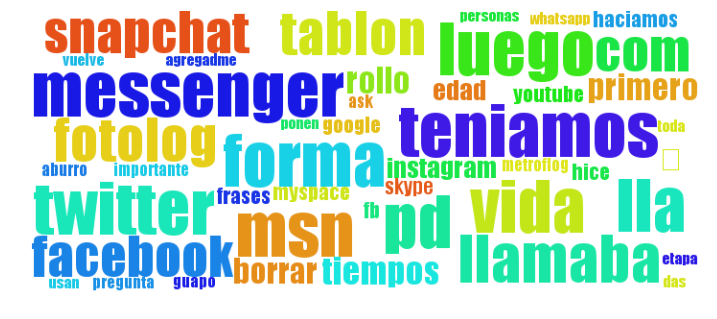

28


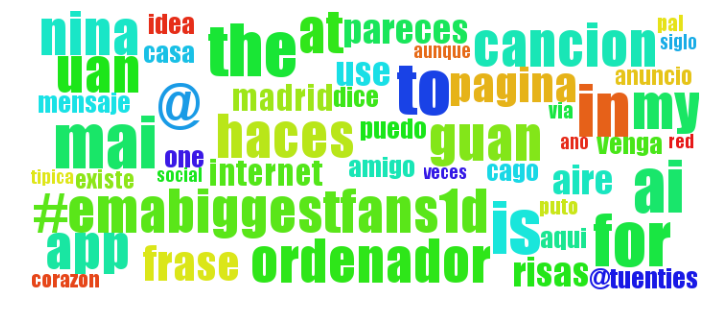

29


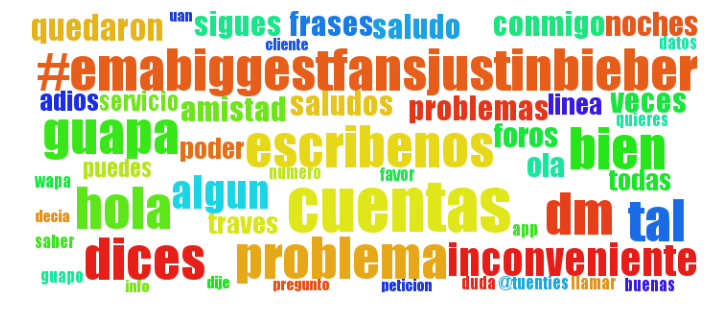

30


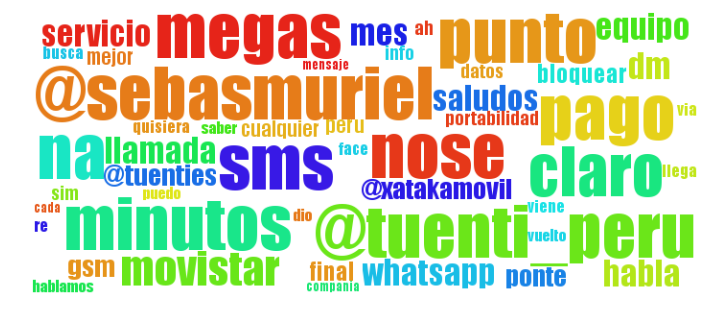

31


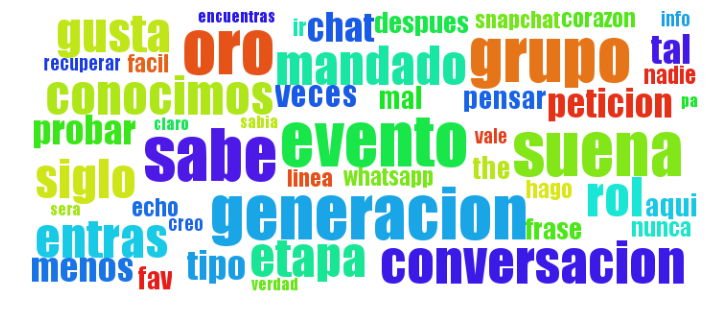

32


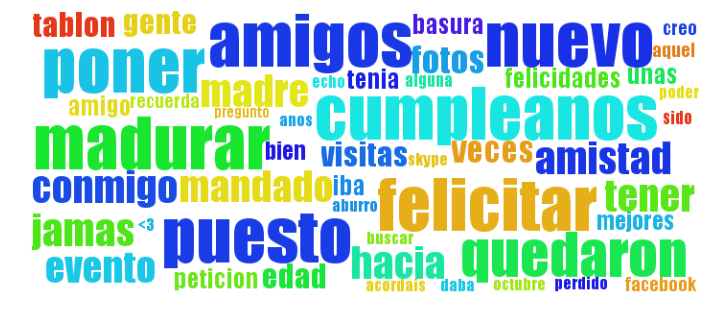

33


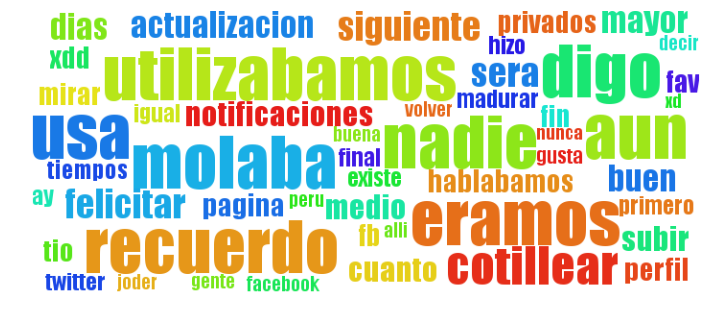

34


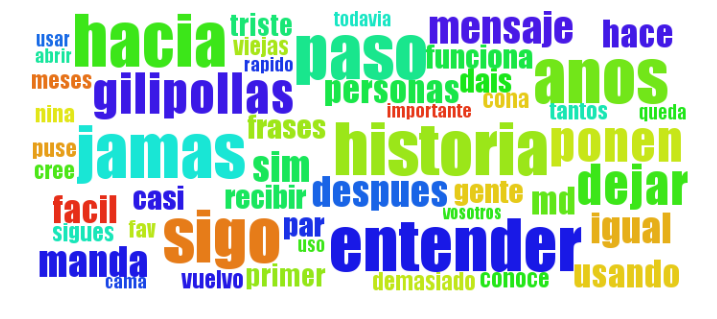

35


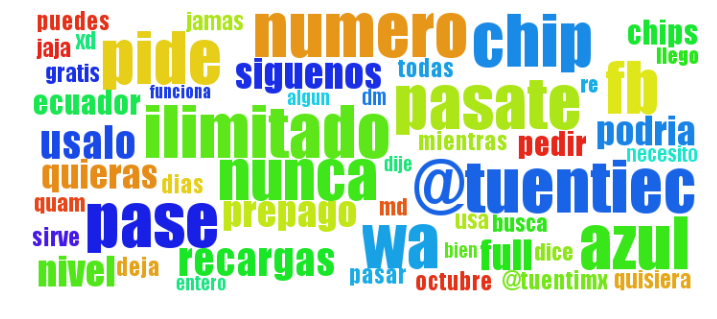

36


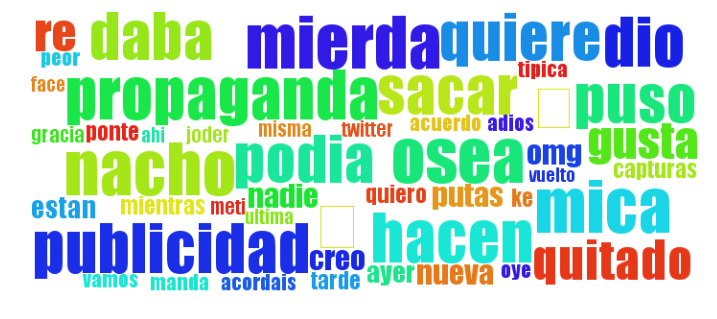

37


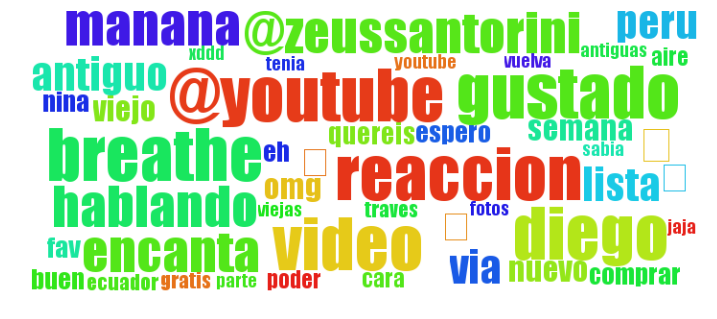

38


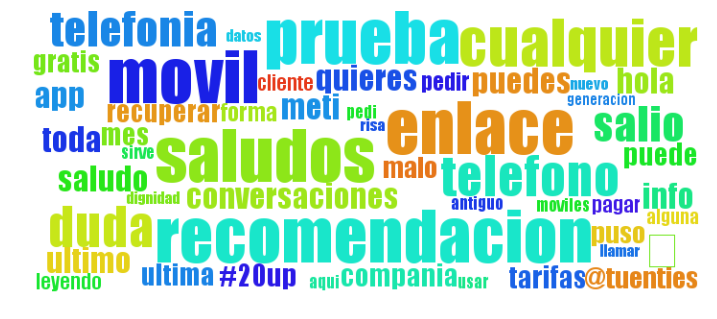

39


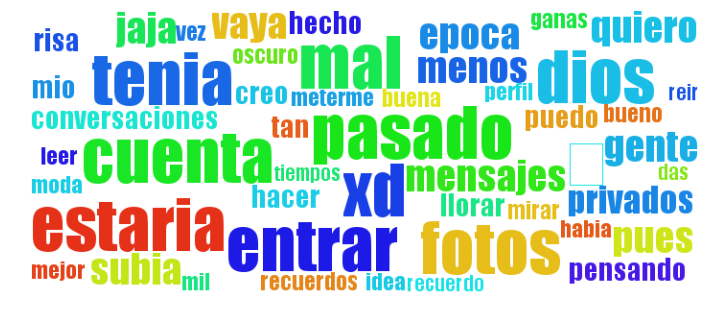

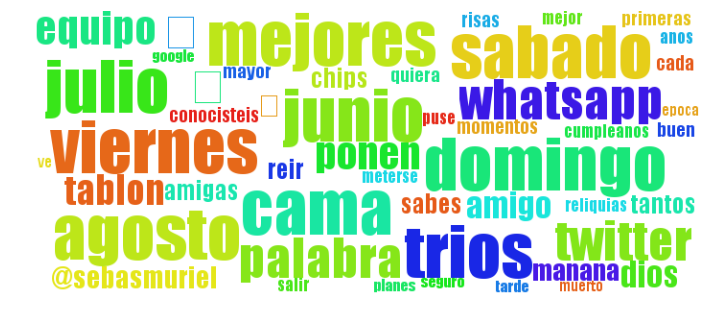

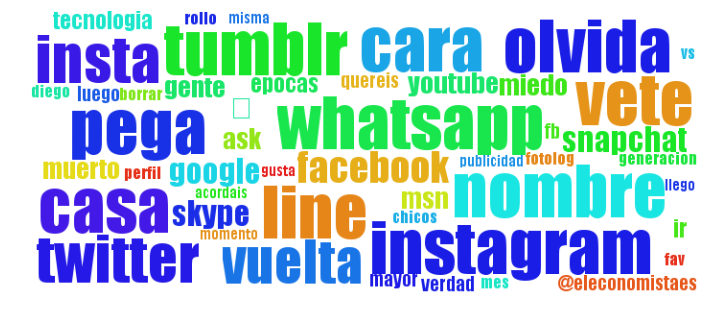

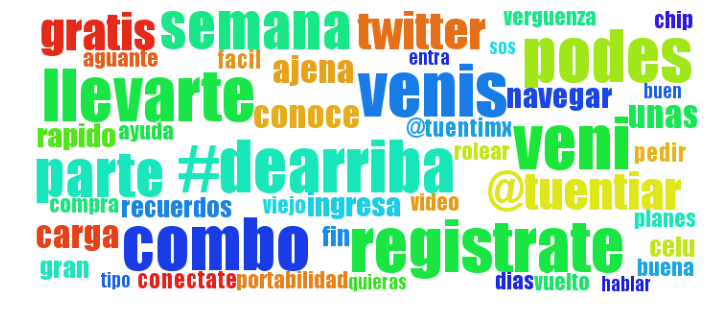

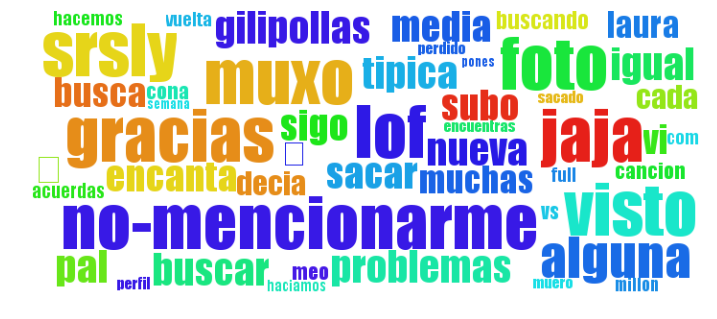

...

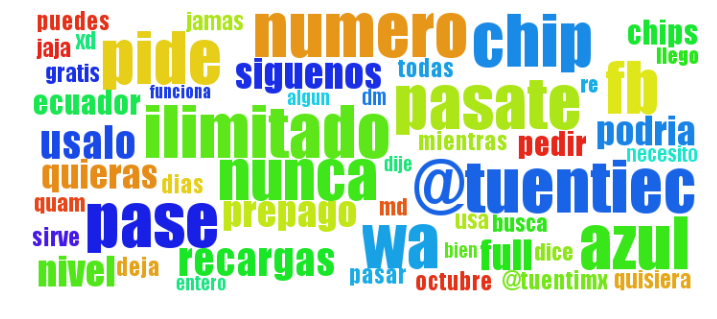

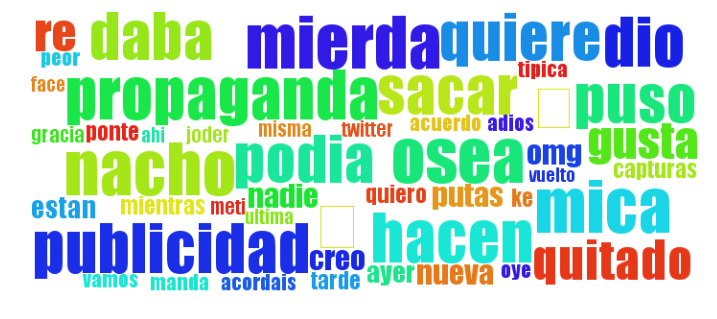

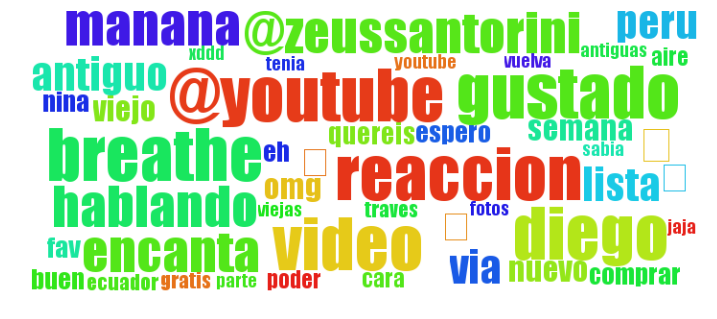

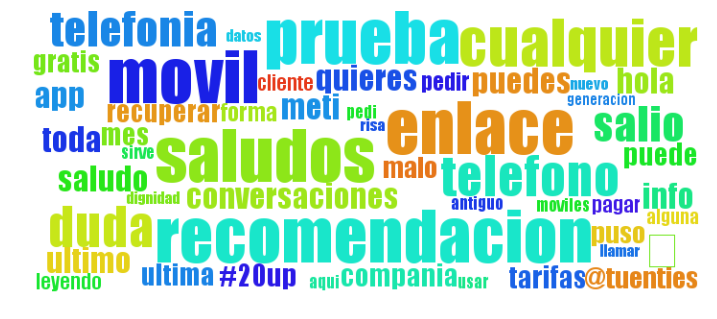

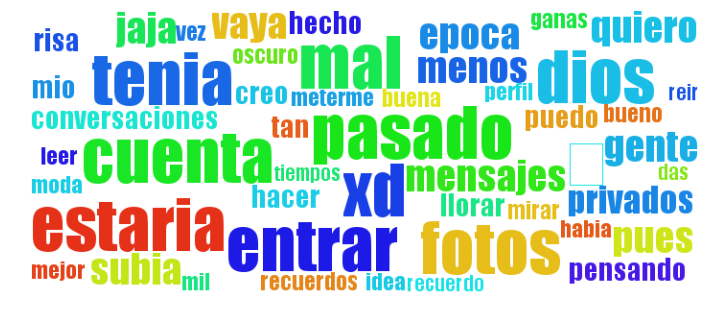

In [64]:
plot_topic_wordclouds(models[40], wordlist)